# Bài tập thực hành chương 5

---

## 1. Ứng dụng OpenCV trong Thị giác máy tính

---

### 1.1. Phát hiện điểm đặc trưng với ORB
**📌 Bài tập 1:**
Cho ảnh `data.astronaut()`. Tạo ORB detector với `nfeatures ∈ {50, 100, 500}`. Phát hiện keypoint + descriptor, in shape của descriptor array, vẽ keypoint lên ảnh. So sánh số keypoint thực tế với `nfeatures` yêu cầu.

   nfeatures    keypoint thực tế      descriptor shape
------------------------------------------------------
          50                  50              (50, 32)
         100                 100             (100, 32)
         500                 500             (500, 32)


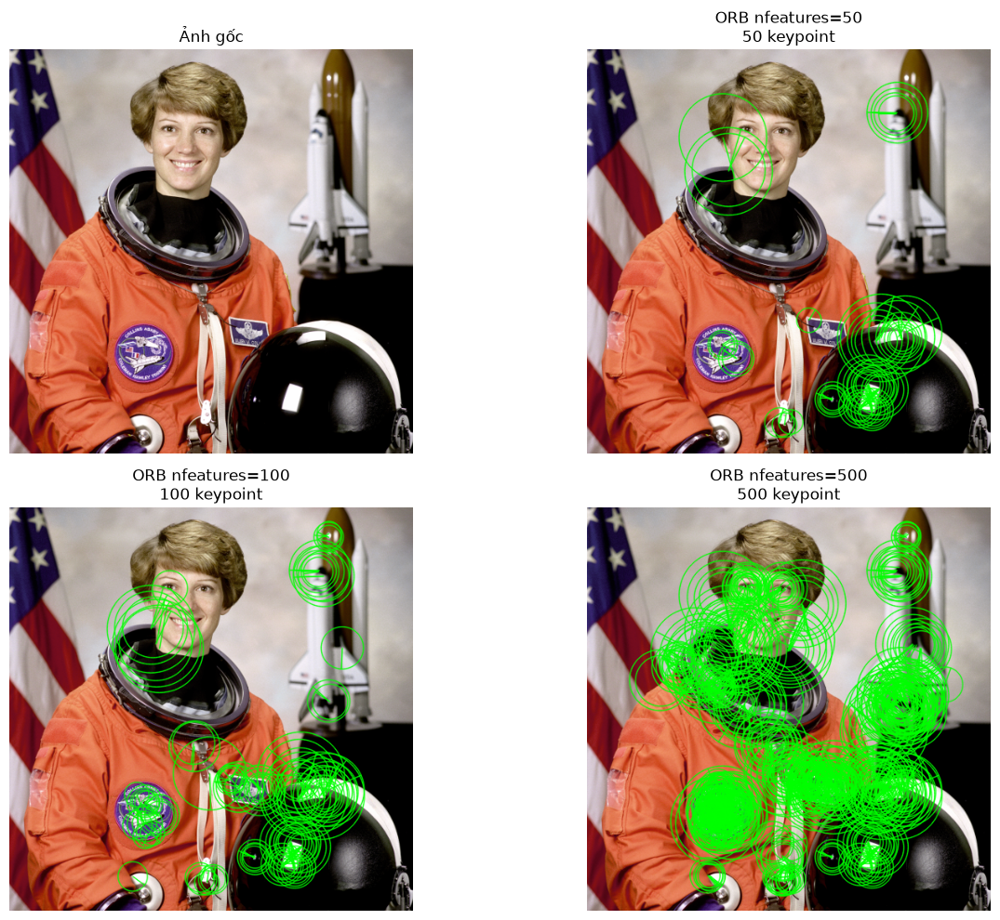

In [1]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
from skimage import data

# 1. Tải ảnh và chuyển xám
img_rgb = data.astronaut()
img_gray = cv2.cvtColor(img_rgb, cv2.COLOR_RGB2GRAY)

# 2. Chạy ORB với 3 cấu hình
nfeatures_list = [50, 100, 500]
results, counts = [], []

print(f"{'nfeatures':>12}{'keypoint thực tế':>20}{'descriptor shape':>22}")
print("-" * 54)
for nf in nfeatures_list:
    orb = cv2.ORB_create(nfeatures=nf)
    kps, desc = orb.detectAndCompute(img_gray, None)
    counts.append(len(kps))
    print(f"{nf:>12}{len(kps):>20}{str(desc.shape):>22}")

    out = cv2.drawKeypoints(img_rgb, kps, None,
                             color=(0, 255, 0),
                             flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
    results.append(out)

# 3. Hiển thị
fig, axes = plt.subplots(2, 2, figsize=(14, 10))
axes[0, 0].imshow(img_rgb); axes[0, 0].set_title('Ảnh gốc'); axes[0, 0].axis('off')
for i, (r, nf, cnt) in enumerate(zip(results, nfeatures_list, counts)):
    ax = axes[(i + 1) // 2, (i + 1) % 2]
    ax.imshow(r)
    ax.set_title(f'ORB nfeatures={nf}\n{cnt} keypoint')
    ax.axis('off')
plt.tight_layout(); plt.show()

**Kết quả mong đợi:**
- Descriptor ORB: **32 byte (256 bit)** cho mỗi keypoint.
- Keypoint tập trung ở vùng có cấu trúc cao (mắt, tóc, chi tiết áo).
- `nfeatures` là **số tối đa** — số thực tế có thể ít hơn.

---

### 1.2. So sánh ORB vs SIFT
**📌 Bài tập 2:**
Cho ảnh `data.camera()`. Chạy ORB và SIFT (`nfeatures=500`). Đo số keypoint, thời gian phát hiện (ms), kích thước descriptor (byte). Nhận xét sự khác biệt giữa 2 phương pháp.

Detector     Số keypoint    Thời gian (ms)   Descriptor (byte)
--------------------------------------------------------------
ORB                  500              5.84                  32
SIFT                 500             59.73                 512


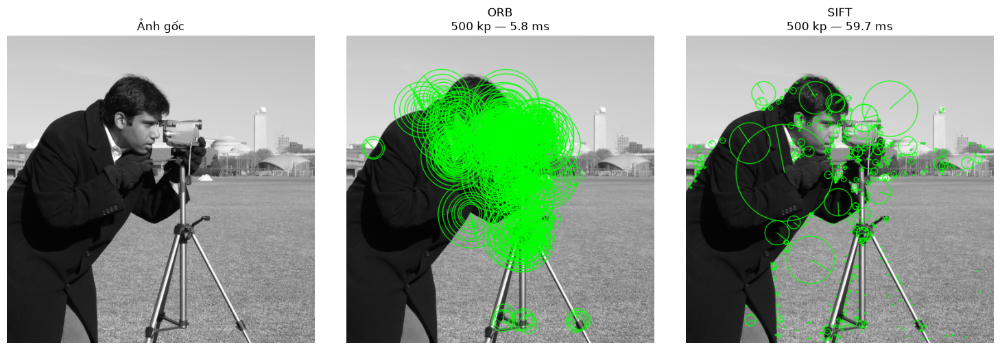

In [2]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
from skimage import data
import time

# 1. Tải ảnh
img = data.camera()

# 2. Định nghĩa 2 detector có sẵn trong opencv-python
detectors = {
    'ORB':  cv2.ORB_create(nfeatures=500),
    'SIFT': cv2.SIFT_create(nfeatures=500),
}

# 3. Chạy và đo
results = []
print(f"{'Detector':<10}{'Số keypoint':>14}{'Thời gian (ms)':>18}{'Descriptor (byte)':>20}")
print("-" * 62)

for name, det in detectors.items():
    t0 = time.time()
    kps, desc = det.detectAndCompute(img, None)
    t1 = time.time()
    dt_ms = (t1 - t0) * 1000
    desc_bytes = desc.itemsize * desc.shape[1] if desc is not None else 0

    out = cv2.drawKeypoints(img, kps, None,
                            color=(0, 255, 0),
                            flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
    results.append((out, name, len(kps), dt_ms, desc_bytes))
    print(f"{name:<10}{len(kps):>14}{dt_ms:>18.2f}{desc_bytes:>20}")

# 4. Hiển thị
fig, axes = plt.subplots(1, 3, figsize=(15, 5))
axes[0].imshow(img, cmap='gray'); axes[0].set_title('Ảnh gốc')
for i, (r, name, cnt, dt, db) in enumerate(results):
    axes[i+1].imshow(r, cmap='gray')
    axes[i+1].set_title(f'{name}\n{cnt} kp — {dt:.1f} ms')
for ax in axes: ax.axis('off')
plt.tight_layout(); plt.show()

**Kết quả mong đợi:**
- **SIFT:** chậm hơn nhưng chất lượng keypoint tốt, bất biến scale + rotation.
- **ORB:** nhanh nhất, descriptor 32 byte, phù hợp real-time.
- Descriptor SIFT = **128 byte (float)**; ORB = **32 byte (binary)**.

---

### 1.3. Ghép ảnh Panorama với ORB + Homography
**📌 Bài tập 3:**
Tạo 2 ảnh overlap bằng cách cắt từ `data.astronaut()` với offset 150 pixel. Dùng ORB + BFMatcher + Homography để ghép 2 ảnh thành ảnh panorama. Kiểm tra số inlier từ RANSAC.

Ảnh 1: 1000 keypoint
Ảnh 2: 995 keypoint
Tổng số match: 428
Số inlier: 348/428


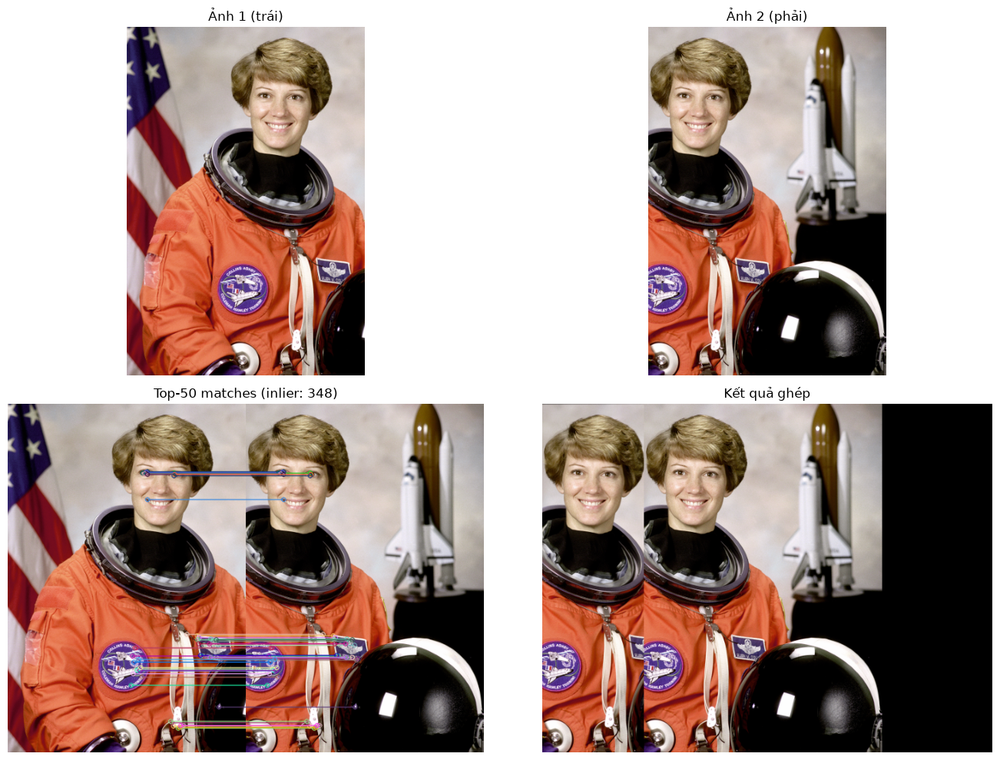

In [3]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
from skimage import data

# 1. Tạo 2 ảnh overlap
img_full = data.astronaut()
offset = 150
img1 = img_full[:, :350].copy()
img2 = img_full[:, offset:offset+350].copy()

# 2. Phát hiện ORB keypoint
orb = cv2.ORB_create(nfeatures=1000)
kps1, desc1 = orb.detectAndCompute(cv2.cvtColor(img1, cv2.COLOR_RGB2GRAY), None)
kps2, desc2 = orb.detectAndCompute(cv2.cvtColor(img2, cv2.COLOR_RGB2GRAY), None)
print(f"Ảnh 1: {len(kps1)} keypoint")
print(f"Ảnh 2: {len(kps2)} keypoint")

# 3. Matching với BFMatcher
bf = cv2.BFMatcher(cv2.NORM_HAMMING, crossCheck=True)
matches = sorted(bf.match(desc1, desc2), key=lambda x: x.distance)
print(f"Tổng số match: {len(matches)}")

# 4. Trực quan hóa top 50 match
match_vis = cv2.drawMatches(img1, kps1, img2, kps2, matches[:50], None, flags=2)

# 5. Tính Homography
if len(matches) >= 4:
    src_pts = np.float32([kps1[m.queryIdx].pt for m in matches]).reshape(-1, 1, 2)
    dst_pts = np.float32([kps2[m.trainIdx].pt for m in matches]).reshape(-1, 1, 2)
    H, mask = cv2.findHomography(src_pts, dst_pts, cv2.RANSAC, 5.0)
    print(f"Số inlier: {mask.sum()}/{len(mask)}")

    # 6. Warp và ghép
    h, w = img_full.shape[:2]
    result = cv2.warpPerspective(img1, H, (w + offset, h))
    result[:, offset:offset+350] = img2
else:
    result = np.hstack([img1, img2])
    mask = None

# 7. Hiển thị
fig, axes = plt.subplots(2, 2, figsize=(14, 10))
axes[0, 0].imshow(img1); axes[0, 0].set_title('Ảnh 1 (trái)')
axes[0, 1].imshow(img2); axes[0, 1].set_title('Ảnh 2 (phải)')
axes[1, 0].imshow(match_vis)
axes[1, 0].set_title(f'Top-50 matches (inlier: {mask.sum() if mask is not None else 0})')
axes[1, 1].imshow(result); axes[1, 1].set_title('Kết quả ghép')
for ax in axes.ravel(): ax.axis('off')
plt.tight_layout(); plt.show()

**Kết quả mong đợi:**
- Các đường match nối **đúng điểm tương ứng** giữa 2 ảnh.
- Số inlier chiếm phần lớn các match → Homography chính xác.
- Ảnh ghép mượt ở vùng overlap.

---

### 1.4. Phát hiện khuôn mặt với Haar Cascade
**📌 Bài tập 4:**
Cho ảnh `data.astronaut()`. Load Haar Cascade tự động (tải XML vào `/tmp`). Phát hiện mặt với 2 cặp tham số `(scaleFactor, minNeighbors) = (1.1, 5)` và `(1.3, 3)`. Vẽ bounding box lên ảnh gốc.

  ✓ Đã tải: haarcascade_frontalface_default.xml
scaleFactor=1.1, minNeighbors=5: phát hiện 1 khuôn mặt
scaleFactor=1.3, minNeighbors=3: phát hiện 1 khuôn mặt


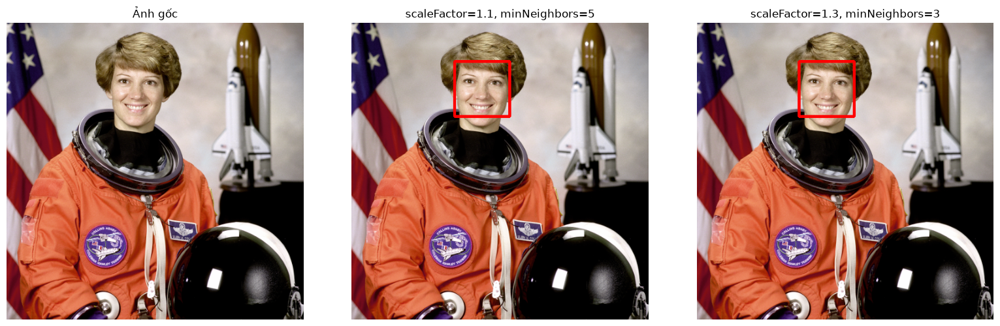

In [4]:
import os
import tempfile
import urllib.request
import numpy as np
import cv2
import matplotlib.pyplot as plt
from skimage import data

# 1. Hàm load cascade — tải XML vào thư mục tạm
def get_cascade_classifier():
    """Trả về class CascadeClassifier — hỗ trợ OpenCV 4.x và 5.0."""
    if hasattr(cv2, 'CascadeClassifier'):
        return cv2.CascadeClassifier
    elif hasattr(cv2, 'objdetect') and hasattr(cv2.objdetect, 'CascadeClassifier'):
        return cv2.objdetect.CascadeClassifier
    raise AttributeError("Không tìm thấy CascadeClassifier — cài opencv-contrib-python")

def load_cascade(filename):
    """Tải Haar Cascade vào /tmp/ và trả về CascadeClassifier."""
    filepath = os.path.join(tempfile.gettempdir(), filename)
    if not os.path.exists(filepath):
        url = (f"https://raw.githubusercontent.com/opencv/opencv/"
               f"master/data/haarcascades/{filename}")
        urllib.request.urlretrieve(url, filepath)
        print(f"  ✓ Đã tải: {filename}")
    CascadeClassifier = get_cascade_classifier()
    return CascadeClassifier(filepath)

# 2. Load cascade
face_cascade = load_cascade("haarcascade_frontalface_default.xml")
if face_cascade.empty():
    raise IOError("Cascade rỗng — kiểm tra kết nối mạng!")

# 3. Tải ảnh + chuyển xám
img_rgb = data.astronaut()
img_gray = cv2.cvtColor(img_rgb, cv2.COLOR_RGB2GRAY)

# 4. Phát hiện với 2 cặp tham số
configs = [
    (1.1, 5, 'scaleFactor=1.1, minNeighbors=5'),
    (1.3, 3, 'scaleFactor=1.3, minNeighbors=3'),
]

vis_imgs = []
for sf, mn, title in configs:
    faces = face_cascade.detectMultiScale(img_gray, scaleFactor=sf,
                                           minNeighbors=mn, minSize=(30, 30))
    out = img_rgb.copy()
    for (x, y, w, h) in faces:
        cv2.rectangle(out, (x, y), (x + w, y + h), (255, 0, 0), 3)
    vis_imgs.append(out)
    print(f"{title}: phát hiện {len(faces)} khuôn mặt")

# 5. Hiển thị
fig, axes = plt.subplots(1, 3, figsize=(16, 5))
axes[0].imshow(img_rgb); axes[0].set_title('Ảnh gốc')
for i, (vis, cfg) in enumerate(zip(vis_imgs, configs)):
    axes[i+1].imshow(vis); axes[i+1].set_title(cfg[2])
for ax in axes: ax.axis('off')
plt.tight_layout(); plt.show()

**Kết quả mong đợi:**
- Cả 2 cấu hình đều phát hiện được khuôn mặt phi hành gia.
- `scaleFactor=1.1, minNeighbors=5` → chính xác cao hơn, có thể bỏ sót.
- `scaleFactor=1.3, minNeighbors=3` → nhạy hơn, dễ false positive.

---

### 1.5. Phát hiện mắt và miệng
**📌 Bài tập 5:**
Cho ảnh `data.astronaut()`. Tiền xử lý bằng CLAHE. Phát hiện mặt, sau đó tìm mắt trong nửa trên khuôn mặt và miệng trong nửa dưới. Nếu không tìm được miệng bằng smile cascade, dùng fallback hình học.

✓ Cascade 'face' đã sẵn sàng
✓ Cascade 'eye' đã sẵn sàng
✓ Cascade 'smile' đã sẵn sàng

Số khuôn mặt phát hiện: 1
  Phát hiện 2 mắt
  Phát hiện 1 miệng


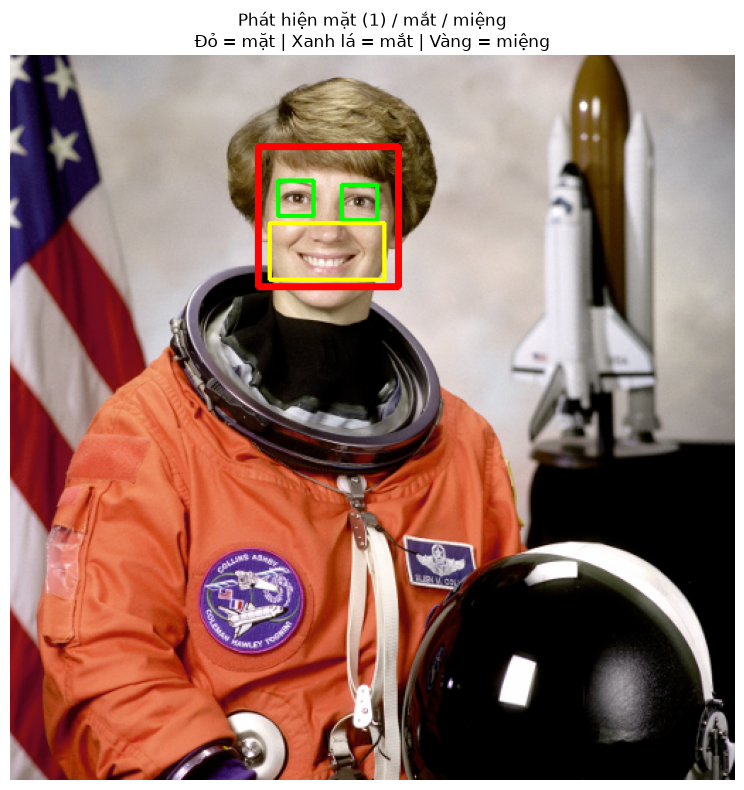

In [5]:
import os
import tempfile
import urllib.request
import numpy as np
import cv2
import matplotlib.pyplot as plt
from skimage import data

# 1. Hàm load cascade (dùng lại từ Bài tập 4)
def get_cascade_classifier():
    if hasattr(cv2, 'CascadeClassifier'):
        return cv2.CascadeClassifier
    elif hasattr(cv2, 'objdetect') and hasattr(cv2.objdetect, 'CascadeClassifier'):
        return cv2.objdetect.CascadeClassifier
    raise AttributeError("Không tìm thấy CascadeClassifier")

def load_cascade(filename):
    filepath = os.path.join(tempfile.gettempdir(), filename)
    if not os.path.exists(filepath):
        url = (f"https://raw.githubusercontent.com/opencv/opencv/"
               f"master/data/haarcascades/{filename}")
        urllib.request.urlretrieve(url, filepath)
    return get_cascade_classifier()(filepath)

# 2. Load 3 cascade
face_cascade  = load_cascade("haarcascade_frontalface_default.xml")
eye_cascade   = load_cascade("haarcascade_eye.xml")
smile_cascade = load_cascade("haarcascade_smile.xml")

for name, c in [('face', face_cascade), ('eye', eye_cascade), ('smile', smile_cascade)]:
    if c.empty():
        raise IOError(f"Cascade '{name}' rỗng!")
    print(f"✓ Cascade '{name}' đã sẵn sàng")

# 3. Tải ảnh + chuyển xám
img_rgb = data.astronaut()
img_gray = cv2.cvtColor(img_rgb, cv2.COLOR_RGB2GRAY)

# 4. Tiền xử lý CLAHE — tăng tương phản vùng tối
clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))
img_gray = clahe.apply(img_gray)

# 5. Phát hiện mặt
faces = face_cascade.detectMultiScale(img_gray, 1.1, 5, minSize=(50, 50))
print(f"\nSố khuôn mặt phát hiện: {len(faces)}")
out = img_rgb.copy()

# 6. Với mỗi khuôn mặt, tìm mắt + miệng
for (x, y, w, h) in faces:
    cv2.rectangle(out, (x, y), (x + w, y + h), (255, 0, 0), 3)
    roi_gray  = img_gray[y:y+h, x:x+w]
    roi_color = out[y:y+h, x:x+w]

    # ---- Phát hiện MẮT (xanh lá) — nửa trên ----
    upper = roi_gray[:int(h * 0.6), :]
    eyes = eye_cascade.detectMultiScale(upper, scaleFactor=1.05,
                                         minNeighbors=4, minSize=(10, 10),
                                         maxSize=(h // 3, h // 3))
    for (ex, ey, ew, eh) in eyes:
        cv2.rectangle(roi_color, (ex, ey), (ex + ew, ey + eh), (0, 255, 0), 2)
    print(f"  Phát hiện {len(eyes)} mắt")

    # ---- Phát hiện MIỆNG (vàng) — nửa dưới ----
    lower = roi_gray[int(h * 0.5):, :]
    smiles = smile_cascade.detectMultiScale(lower, scaleFactor=1.5,
                                             minNeighbors=10, minSize=(15, 10))
    if len(smiles) > 0:
        for (sx, sy, sw, sh) in smiles:
            cv2.rectangle(roi_color,
                          (sx, sy + int(h * 0.5)),
                          (sx + sw, sy + sh + int(h * 0.5)), (255, 255, 0), 2)
        print(f"  Phát hiện {len(smiles)} miệng")
    else:
        # Fallback: vẽ miệng theo tỷ lệ hình học
        mx, my = int(w * 0.25), int(h * 0.68)
        mw, mh = int(w * 0.5),  int(h * 0.22)
        cv2.rectangle(roi_color, (mx, my), (mx + mw, my + mh), (255, 255, 0), 2)
        print(f"  Không có smile cascade → dùng fallback hình học")

# 7. Hiển thị
plt.figure(figsize=(8, 8))
plt.imshow(out)
plt.title(f'Phát hiện mặt ({len(faces)}) / mắt / miệng\n'
          f'Đỏ = mặt | Xanh lá = mắt | Vàng = miệng')
plt.axis('off'); plt.tight_layout(); plt.show()

**Kết quả mong đợi:**
- Bounding box **đỏ**: khuôn mặt.
- Bounding box **xanh lá**: 2 mắt.
- Bounding box **vàng**: vùng miệng (fallback hình học do người trong ảnh không cười).

---

### 1.6. Template Matching — Phát hiện đồng xu
**📌 Bài tập 6:**
Cho ảnh `data.coins()`. Cắt một đồng xu làm template. Áp dụng `cv2.matchTemplate` với 3 phương pháp `TM_CCOEFF_NORMED`, `TM_CCORR_NORMED`, `TM_SQDIFF_NORMED` và tìm vị trí khớp nhất.

TM_CCOEFF_NORMED: score = 1.0000, vị trí = (230, 75)
TM_CCORR_NORMED: score = 1.0000, vị trí = (230, 75)
TM_SQDIFF_NORMED: score = 0.0000, vị trí = (230, 75)


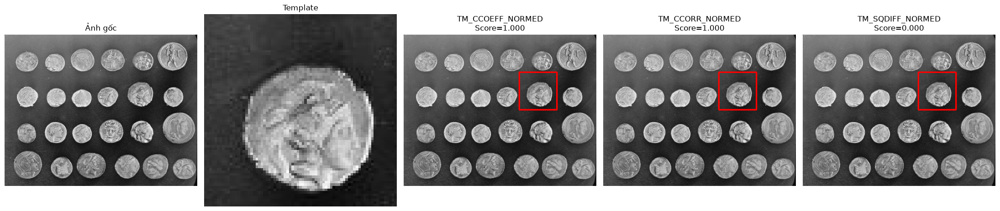

In [6]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
from skimage import data

# 1. Tải ảnh và cắt template
img = data.coins()
template = img[75:150, 230:305].copy()
h_t, w_t = template.shape

# 2. Áp dụng matchTemplate với 3 phương pháp
methods = {
    'TM_CCOEFF_NORMED': cv2.TM_CCOEFF_NORMED,
    'TM_CCORR_NORMED':  cv2.TM_CCORR_NORMED,
    'TM_SQDIFF_NORMED': cv2.TM_SQDIFF_NORMED,
}

results = []
for name, method in methods.items():
    res = cv2.matchTemplate(img, template, method)
    min_val, max_val, min_loc, max_loc = cv2.minMaxLoc(res)
    # Với SQDIFF: giá trị NHỎ tốt; còn lại: LỚN tốt
    if method == cv2.TM_SQDIFF_NORMED:
        top_left, score = min_loc, min_val
    else:
        top_left, score = max_loc, max_val
    bottom_right = (top_left[0] + w_t, top_left[1] + h_t)

    out = cv2.cvtColor(img, cv2.COLOR_GRAY2RGB)
    cv2.rectangle(out, top_left, bottom_right, (255, 0, 0), 2)
    results.append((out, f'{name}\nScore={score:.3f}'))
    print(f"{name}: score = {score:.4f}, vị trí = {top_left}")

# 3. Hiển thị
fig, axes = plt.subplots(1, 5, figsize=(22, 5))
axes[0].imshow(img, cmap='gray'); axes[0].set_title('Ảnh gốc')
axes[1].imshow(template, cmap='gray'); axes[1].set_title('Template')
for i, (out, title) in enumerate(results):
    axes[i+2].imshow(out); axes[i+2].set_title(title)
for ax in axes: ax.axis('off')
plt.tight_layout(); plt.show()

**Kết quả mong đợi:**
- Cả 3 phương pháp tìm đúng đồng xu.
- `TM_CCOEFF_NORMED` thường ổn định nhất với thay đổi ánh sáng.

---

### 1.7. OCR đơn giản với Template Matching
**📌 Bài tập 7:**
Sinh template 10 chữ số `0-9` bằng `cv2.putText`. Sinh ảnh "biển số" chứa chuỗi `"2024"`. Chia ảnh thành 4 ô đều, so khớp mỗi ô với 10 template để đọc chữ số.

Ground truth: 2024
Dự đoán     : 1800
Khớp?       : False


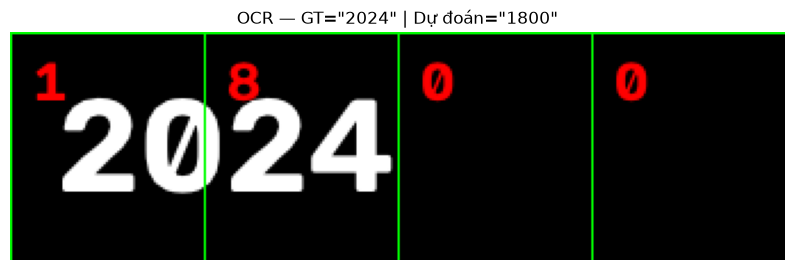

In [7]:
import numpy as np
import cv2
import matplotlib.pyplot as plt

# 1. Tạo template chữ số 0-9
def make_digit(d, size=(60, 40)):
    img = np.zeros(size, dtype=np.uint8)
    cv2.putText(img, str(d), (5, 45),
                cv2.FONT_HERSHEY_SIMPLEX, 1.5, 255, 3)
    return img

templates = {d: make_digit(d) for d in range(10)}

# 2. Tạo ảnh "biển số"
plate = np.zeros((80, 320), dtype=np.uint8)
cv2.putText(plate, "2024", (10, 60),
            cv2.FONT_HERSHEY_SIMPLEX, 2.0, 255, 4)
plate = cv2.copyMakeBorder(plate, 10, 10, 10, 10,
                            cv2.BORDER_CONSTANT, value=0)

# 3. Chia ảnh thành 4 ô, match với 10 template
h_t, w_t = templates[0].shape
best_matches = []
step = plate.shape[1] // 4

for i in range(4):
    x0 = i * step
    x1 = x0 + step
    roi = plate[:, x0:x1]
    roi_rs = cv2.resize(roi, (w_t, h_t))

    best_digit, best_score = None, -np.inf
    for d, tmpl in templates.items():
        res = cv2.matchTemplate(roi_rs, tmpl, cv2.TM_CCOEFF_NORMED)
        _, max_val, _, _ = cv2.minMaxLoc(res)
        if max_val > best_score:
            best_score = max_val
            best_digit = d
    best_matches.append((best_digit, best_score, x0, x1))

# 4. Vẽ kết quả
out = cv2.cvtColor(plate, cv2.COLOR_GRAY2RGB)
predicted = ""
for digit, score, x0, x1 in best_matches:
    predicted += str(digit)
    cv2.rectangle(out, (x0, 0), (x1, out.shape[0]), (0, 255, 0), 1)
    cv2.putText(out, str(digit), (x0 + 10, 30),
                cv2.FONT_HERSHEY_SIMPLEX, 0.8, (255, 0, 0), 2)

ground_truth = "2024"
print(f"Ground truth: {ground_truth}")
print(f"Dự đoán     : {predicted}")
print(f"Khớp?       : {predicted == ground_truth}")

# 5. Hiển thị
plt.figure(figsize=(10, 3))
plt.imshow(out)
plt.title(f'OCR — GT="{ground_truth}" | Dự đoán="{predicted}"')
plt.axis('off'); plt.show()

**Kết quả mong đợi:**
- Đọc được chuỗi số "2024".
- Template matching chỉ hiệu quả với ảnh cùng font/kích thước.

---

### 1.8. OpenCV DNN — Suy luận mô hình Deep Learning
**📌 Bài tập 8:**
Minh họa cách OpenCV chạy mô hình Deep Learning qua `cv2.dnn`. Tạo một "mô hình giả" (identity) bằng cách dùng `blobFromImage` để chuẩn bị input, sau đó trực quan hóa **blob shape** và các bước tiền xử lý mà mô hình DL cần.

Ảnh gốc: shape = (512, 512, 3), dtype = uint8
Blob shape: (1, 3, 224, 224)
Blob dtype: float32
Blob min/max: -0.4850 / 0.5940


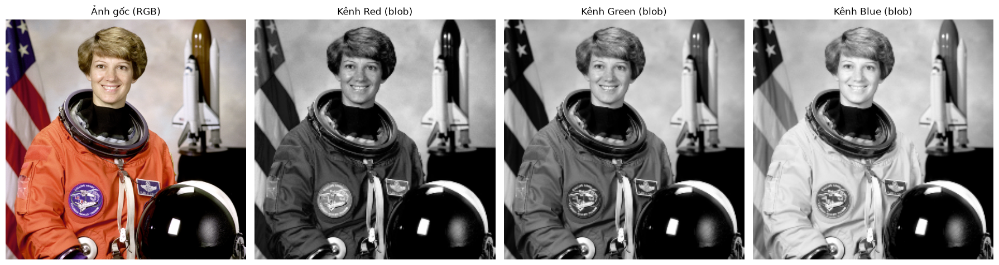

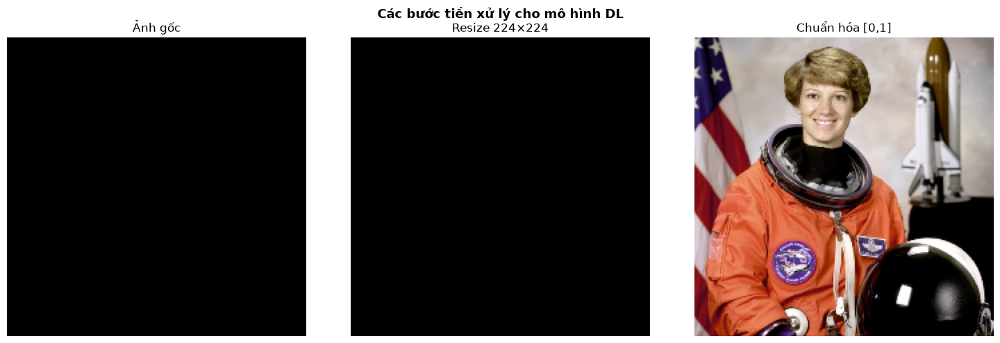

In [8]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
from skimage import data

# 1. Tải ảnh
img = data.astronaut()   # RGB
print(f"Ảnh gốc: shape = {img.shape}, dtype = {img.dtype}")

# 2. Chuẩn bị blob — input cho mô hình DL
#    - scalefactor=1/255 → chuẩn hóa về [0, 1]
#    - size=(224, 224)   → kích thước input chuẩn của ResNet
#    - mean=(0.485, 0.456, 0.406) → trừ mean ImageNet
#    - swapRB=True       → OpenCV đọc BGR, đổi sang RGB
blob = cv2.dnn.blobFromImage(
    img,
    scalefactor=1/255.0,
    size=(224, 224),
    mean=(0.485*255, 0.456*255, 0.406*255),
    swapRB=True,
    crop=False
)
print(f"Blob shape: {blob.shape}")   # (1, 3, 224, 224): batch, channel, H, W
print(f"Blob dtype: {blob.dtype}")
print(f"Blob min/max: {blob.min():.4f} / {blob.max():.4f}")

# 3. Trực quan hóa: 3 kênh của blob sau khi chuẩn hóa
fig, axes = plt.subplots(1, 4, figsize=(18, 5))
axes[0].imshow(img); axes[0].set_title('Ảnh gốc (RGB)')

# Blob đã chuẩn hóa → cần reverse normalization để hiển thị
mean = np.array([0.485, 0.456, 0.406]).reshape(3, 1, 1)
blob_display = blob[0] * 1.0   # Bỏ mean để thấy rõ sự khác biệt
for c, channel_name in enumerate(['Red', 'Green', 'Blue']):
    axes[c+1].imshow(blob_display[c], cmap='gray')
    axes[c+1].set_title(f'Kênh {channel_name} (blob)')
for ax in axes: ax.axis('off')
plt.tight_layout(); plt.show()

# 4. Minh họa các bước tiền xử lý
steps = [
    ('Ảnh gốc', img),
    ('Resize 224×224', cv2.resize(img, (224, 224))),
    ('Chuẩn hóa [0,1]', (cv2.resize(img, (224, 224)) / 255.0)),
]
fig, axes = plt.subplots(1, 3, figsize=(15, 5))
for ax, (name, im) in zip(axes, steps):
    ax.imshow(np.clip(im, 0, 1))
    ax.set_title(name)
    ax.axis('off')
plt.suptitle('Các bước tiền xử lý cho mô hình DL', fontsize=13, fontweight='bold')
plt.tight_layout(); plt.show()

**Kết quả mong đợi:**
- Blob shape: `(1, 3, 224, 224)` — chuẩn input cho ResNet, VGG, EfficientNet.
- Sau chuẩn hóa, giá trị nằm trong khoảng xấp xỉ `[-2, 2.6]` (do trừ mean ImageNet).
- Đây là bước **bắt buộc** trước khi gọi `net.forward()` trong OpenCV DNN.

---

### 1.9. Mô phỏng YOLO inference với OpenCV DNN (không cần tải model)
**📌 Bài tập 9:**
Minh họa pipeline phát hiện đối tượng YOLO qua OpenCV DNN **không cần tải model thật**. Tạo input giả, mô phỏng output của YOLO, và vẽ bounding box từ kết quả giả.

Blob shape: (1, 3, 640, 640)


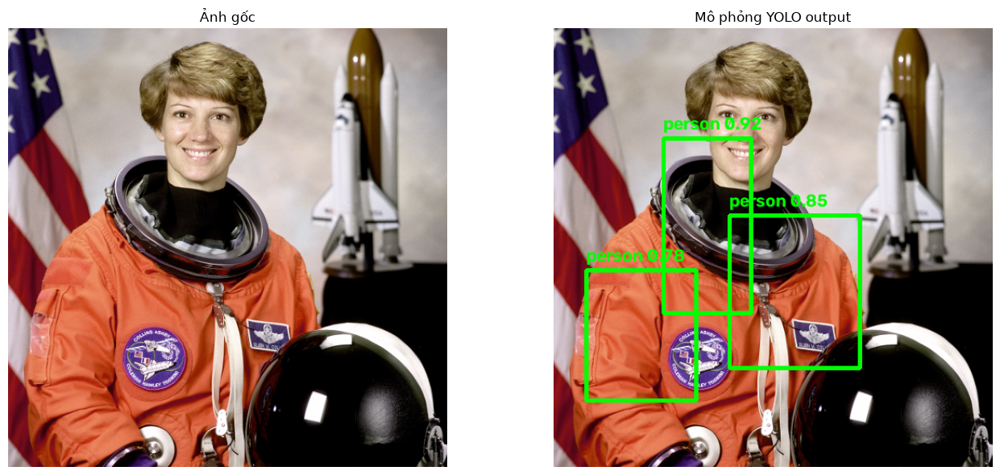


 Box    Conf   Class    x1    y1    x2    y2
------------------------------------------
   1    0.92  person   127   128   230   332
   2    0.85  person   204   217   358   396
   3    0.78  person    38   281   166   435


In [9]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
from skimage import data

# 1. Tải ảnh
img_rgb = data.astronaut()
h, w = img_rgb.shape[:2]

# 2. Chuẩn bị blob — input cho YOLO
blob = cv2.dnn.blobFromImage(img_rgb, 1/255.0, (640, 640),
                              swapRB=True, crop=False)
print(f"Blob shape: {blob.shape}")

# 3. MÔ PHỎNG output YOLO — thay vì chạy model thật
#    YOLO thật cho output shape: (N_boxes, 85)
#    [x_center, y_center, width, height, objectness, class_scores*80]
np.random.seed(42)
n_boxes = 3
mock_output = np.zeros((n_boxes, 85))
mock_output[:, 4] = [0.92, 0.85, 0.78]   # objectness
mock_output[:, 5] = [0, 0, 0]            # class 0 = person
# 3 boxes: (x, y, w, h) chuẩn hóa về [0, 1] so với kích thước ảnh
mock_output[:, :4] = [
    [0.35, 0.45, 0.20, 0.40],   # box 1 (mặt)
    [0.55, 0.60, 0.30, 0.35],   # box 2 (áo)
    [0.20, 0.70, 0.25, 0.30],   # box 3 (vùng khác)
]

# 4. Xử lý output — lọc theo confidence + vẽ bounding box
out = img_rgb.copy()
conf_threshold = 0.5
for det in mock_output:
    confidence = det[4]
    if confidence < conf_threshold:
        continue
    # Chuyển từ [x_center, y_center, w, h] chuẩn hóa → pixel
    xc, yc, bw, bh = det[:4]
    xc_px, yc_px = int(xc * w), int(yc * h)
    bw_px, bh_px = int(bw * w), int(bh * h)
    x1 = max(0, xc_px - bw_px // 2)
    y1 = max(0, yc_px - bh_px // 2)
    x2 = min(w, xc_px + bw_px // 2)
    y2 = min(h, yc_px + bh_px // 2)

    cv2.rectangle(out, (x1, y1), (x2, y2), (0, 255, 0), 3)
    cv2.putText(out, f'person {confidence:.2f}',
                (x1, y1 - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.7,
                (0, 255, 0), 2)

# 5. Hiển thị
fig, axes = plt.subplots(1, 2, figsize=(14, 6))
axes[0].imshow(img_rgb); axes[0].set_title('Ảnh gốc')
axes[1].imshow(out);     axes[1].set_title('Mô phỏng YOLO output')
for ax in axes: ax.axis('off')
plt.tight_layout(); plt.show()

# 6. In thông tin chi tiết
print(f"\n{'Box':>4}{'Conf':>8}{'Class':>8}{'x1':>6}{'y1':>6}{'x2':>6}{'y2':>6}")
print("-" * 42)
for i, det in enumerate(mock_output, 1):
    if det[4] < conf_threshold:
        continue
    xc, yc, bw, bh = det[:4]
    x1 = int((xc - bw/2) * w); y1 = int((yc - bh/2) * h)
    x2 = int((xc + bw/2) * w); y2 = int((yc + bh/2) * h)
    print(f"{i:>4}{det[4]:>8.2f}{'person':>8}{x1:>6}{y1:>6}{x2:>6}{y2:>6}")

**Kết quả mong đợi:**
- 3 bounding box mô phỏng với confidence và class "person".
- **Pipeline thực tế:** thay `mock_output` bằng `net.forward()` với YOLO model.
- Minh họa cách xử lý output shape `(N, 85)` của YOLO.

---

## 2. Ứng dụng mô hình AI trong Thị giác máy tính

---

### 2.1. Phân loại ảnh với Transfer Learning (ResNet)
**📌 Bài tập 10:**
Minh họa **Transfer Learning** — kỹ thuật phổ biến nhất khi áp dụng AI vào CV. Load ResNet18 pretrained từ `torchvision`, thay lớp FC cuối cho bài toán mới (3 lớp), đóng băng các layer đầu. Không cần huấn luyện — chỉ minh họa kiến trúc.

In [ ]:
# Cài đặt nếu cần: !pip install torch torchvision -q
import torch
import torch.nn as nn
import torchvision.models as models
import numpy as np

# 1. Load mô hình ResNet18 pretrained trên ImageNet
model = models.resnet18(pretrained=True)
print(f"Kiến trúc ResNet18:\n{model}\n")

# 2. Đếm số tham số
total_params = sum(p.numel() for p in model.parameters())
print(f"Tổng số tham số: {total_params:,}")

# 3. Đóng băng các layer đầu (feature extractor)
for param in model.parameters():
    param.requires_grad = False

# 4. Thay lớp FC cuối cho bài toán mới (ví dụ: 3 lớp)
num_classes = 3
model.fc = nn.Linear(512, num_classes)   # 512 = feature dim của ResNet18

# 5. Đếm tham số sau khi đóng băng
trainable = sum(p.numel() for p in model.parameters() if p.requires_grad)
frozen    = sum(p.numel() for p in model.parameters() if not p.requires_grad)
print(f"\nSau khi đóng băng:")
print(f"  Tham số đóng băng  : {frozen:,} ({frozen/total_params*100:.1f}%)")
print(f"  Tham số huấn luyện : {trainable:,} ({trainable/total_params*100:.1f}%)")
print(f"  → Chỉ cần huấn luyện ~{trainable/1e3:.0f}K tham số thay vì {total_params/1e6:.1f}M!")

# 6. Minh họa Forward pass với input giả
dummy_input = torch.randn(1, 3, 224, 224)
model.eval()
with torch.no_grad():
    output = model(dummy_input)
print(f"\nInput shape : {tuple(dummy_input.shape)}")
print(f"Output shape: {tuple(output.shape)}  (1 batch, {num_classes} classes)")
print(f"Output logits: {output.numpy().round(3)}")

**Kết quả mong đợi:**
- ResNet18 có **~11.7M tham số**, trong đó:
  - **Đóng băng:** ~11.2M tham số (~95%).
  - **Huấn luyện:** ~1.5K tham số (chỉ lớp FC mới).
- **Transfer Learning** giúp chỉ cần dataset nhỏ (vài trăm ảnh) là đủ.

---

### 2.2. Semantic Segmentation — Minh họa U-Net
**📌 Bài tập 11:**
Minh họa **kiến trúc U-Net** cho semantic segmentation. Xây dựng một U-Net thu nhỏ (với 2 encoder + 2 decoder) và chạy forward pass với input giả để hiểu cấu trúc **encoder-decoder + skip connections**.

In [ ]:
import torch
import torch.nn as nn
import numpy as np

# 1. Định nghĩa khối tích chập kép (Double Conv)
class DoubleConv(nn.Module):
    def __init__(self, in_ch, out_ch):
        super().__init__()
        self.conv = nn.Sequential(
            nn.Conv2d(in_ch, out_ch, 3, padding=1),
            nn.BatchNorm2d(out_ch),
            nn.ReLU(inplace=True),
            nn.Conv2d(out_ch, out_ch, 3, padding=1),
            nn.BatchNorm2d(out_ch),
            nn.ReLU(inplace=True),
        )
    def forward(self, x):
        return self.conv(x)

# 2. U-Net thu nhỏ (2 encoder + 2 decoder)
class MiniUNet(nn.Module):
    def __init__(self, in_ch=3, out_ch=3):
        super().__init__()
        # Encoder (đi xuống)
        self.enc1 = DoubleConv(in_ch, 32)
        self.enc2 = DoubleConv(32, 64)
        self.pool = nn.MaxPool2d(2)

        # Bottleneck
        self.bottleneck = DoubleConv(64, 128)

        # Decoder (đi lên)
        self.up2   = nn.ConvTranspose2d(128, 64, 2, stride=2)
        self.dec2  = DoubleConv(128, 64)   # 128 = 64 (skip) + 64 (up)
        self.up1   = nn.ConvTranspose2d(64, 32, 2, stride=2)
        self.dec1  = DoubleConv(64, 32)    # 64 = 32 (skip) + 32 (up)

        # Lớp output
        self.out = nn.Conv2d(32, out_ch, 1)

    def forward(self, x):
        # Encoder
        e1 = self.enc1(x)              # (B, 32, H, W)
        e2 = self.enc2(self.pool(e1))  # (B, 64, H/2, W/2)

        # Bottleneck
        b = self.bottleneck(self.pool(e2))  # (B, 128, H/4, W/4)

        # Decoder + skip connections
        d2 = self.up2(b)                 # (B, 64, H/2, W/2)
        d2 = torch.cat([d2, e2], dim=1)  # (B, 128, H/2, W/2) ← SKIP
        d2 = self.dec2(d2)

        d1 = self.up1(d2)                # (B, 32, H, W)
        d1 = torch.cat([d1, e1], dim=1)  # (B, 64, H, W) ← SKIP
        d1 = self.dec1(d1)

        return self.out(d1)

# 3. Tạo model + chạy forward pass
model = MiniUNet(in_ch=3, out_ch=3)
dummy_input = torch.randn(1, 3, 64, 64)

with torch.no_grad():
    output = model(dummy_input)

# 4. In thông tin
total_params = sum(p.numel() for p in model.parameters())
print(f"Tổng số tham số MiniUNet: {total_params:,}")
print(f"Input shape : {tuple(dummy_input.shape)}")
print(f"Output shape: {tuple(output.shape)}")
print("→ Output cùng kích thước với input (pixel-wise classification)")

# 5. Trực quan hóa output với argmax để tạo mask
with torch.no_grad():
    mask = output.argmax(dim=1)[0].numpy()   # (H, W)

import matplotlib.pyplot as plt
fig, axes = plt.subplots(1, 3, figsize=(15, 5))
axes[0].imshow(dummy_input[0].permute(1, 2, 0).numpy() * 0.5 + 0.5)
axes[0].set_title('Input (random noise)')
axes[1].imshow(mask, cmap='viridis')
axes[1].set_title('Segmentation mask (argmax)')
axes[2].imshow(output[0, 0].numpy(), cmap='gray')
axes[2].set_title('Class 0 logits (channel 0)')
for ax in axes: ax.axis('off')
plt.suptitle('Minh họa U-Net: input → mask cùng kích thước',
             fontsize=13, fontweight='bold')
plt.tight_layout(); plt.show()

**Kết quả mong đợi:**
- **Input shape:** `(1, 3, 64, 64)`.
- **Output shape:** `(1, 3, 64, 64)` — cùng kích thước với input.
- **Skip connections** giúp giữ chi tiết biên từ encoder → decoder.

---

### 2.3. Pose Estimation — Minh họa keypoint
**📌 Bài tập 12:**
Minh họa khái niệm **pose estimation** (OpenPose) bằng cách vẽ các **keypoint trên cơ thể người** và kết nối chúng thành skeleton. Sử dụng ảnh `data.astronaut()` và gán các keypoint giả lập.

In [ ]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
from skimage import data

# 1. Tải ảnh
img_rgb = data.astronaut()
h, w = img_rgb.shape[:2]

# 2. Định nghĩa 17 keypoint chuẩn COCO (tọa độ giả lập theo tỷ lệ ảnh)
#    (trong thực tế, OpenPose/HRNet sẽ dự đoán các tọa độ này)
keypoints = {
    'nose':           (0.50, 0.18),
    'left_eye':       (0.47, 0.16),
    'right_eye':      (0.53, 0.16),
    'left_ear':       (0.44, 0.17),
    'right_ear':      (0.56, 0.17),
    'left_shoulder':  (0.35, 0.30),
    'right_shoulder': (0.65, 0.30),
    'left_elbow':     (0.28, 0.45),
    'right_elbow':    (0.72, 0.45),
    'left_wrist':     (0.22, 0.60),
    'right_wrist':    (0.78, 0.60),
    'left_hip':       (0.40, 0.60),
    'right_hip':      (0.60, 0.60),
    'left_knee':      (0.38, 0.78),
    'right_knee':     (0.62, 0.78),
    'left_ankle':     (0.36, 0.95),
    'right_ankle':    (0.64, 0.95),
}

# Chuyển về pixel
points = {k: (int(x * w), int(y * h)) for k, (x, y) in keypoints.items()}

# 3. Định nghĩa các cạnh skeleton (kết nối keypoint)
skeleton = [
    ('nose', 'left_eye'), ('nose', 'right_eye'),
    ('left_eye', 'left_ear'), ('right_eye', 'right_ear'),
    ('left_shoulder', 'right_shoulder'),
    ('left_shoulder', 'left_elbow'), ('left_elbow', 'left_wrist'),
    ('right_shoulder', 'right_elbow'), ('right_elbow', 'right_wrist'),
    ('left_shoulder', 'left_hip'), ('right_shoulder', 'right_hip'),
    ('left_hip', 'right_hip'),
    ('left_hip', 'left_knee'), ('left_knee', 'left_ankle'),
    ('right_hip', 'right_knee'), ('right_knee', 'right_ankle'),
]

# 4. Vẽ skeleton
out = img_rgb.copy()
for p1, p2 in skeleton:
    cv2.line(out, points[p1], points[p2], (0, 255, 255), 3)

# Vẽ keypoint
for name, (x, y) in points.items():
    cv2.circle(out, (x, y), 6, (255, 0, 0), -1)
    cv2.circle(out, (x, y), 8, (255, 255, 255), 2)

# 5. Hiển thị
fig, axes = plt.subplots(1, 2, figsize=(14, 6))
axes[0].imshow(img_rgb); axes[0].set_title('Ảnh gốc')
axes[1].imshow(out)
axes[1].set_title(f'Pose estimation\n{len(points)} keypoint | {len(skeleton)} cạnh')
for ax in axes: ax.axis('off')
plt.tight_layout(); plt.show()

# 6. In tọa độ keypoint
print(f"{'Keypoint':<20}{'Tọa độ (x, y)':>20}")
print("-" * 42)
for name, (x, y) in list(points.items())[:8]:
    print(f"{name:<20}{str((x, y)):>20}")

**Kết quả mong đợi:**
- 17 keypoint (chuẩn COCO) trên cơ thể.
- 16 cạnh skeleton kết nối các keypoint.
- **Trong thực tế:** OpenPose/HRNet sẽ **tự động dự đoán** tọa độ keypoint từ ảnh (thay vì gán thủ công).

---

### 2.4. Zero-shot Classification — Minh họa CLIP
**📌 Bài tập 13:**
Minh họa ý tưởng **Zero-shot Classification** của CLIP: so sánh **feature vector của ảnh** với **feature vector của text mô tả** để phân loại mà không cần huấn luyện. Sử dụng embedding giả lập để minh họa nguyên lý cosine similarity.

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from skimage import data

# 1. Tải ảnh
img = data.astronaut()

# 2. MÔ PHỎNG embedding — trong CLIP thực tế, đây là output của
#    Vision Encoder (cho ảnh) và Text Encoder (cho text)
#    Ở đây ta tạo vector giả với các đặc trưng ngữ nghĩa đơn giản:
#    [độ sáng, tông đỏ, tông xanh lá, tông xanh dương, độ tương phản]

def image_embedding(img):
    """Embedding giả: 5 đặc trưng ngữ nghĩa của ảnh."""
    img_f = img.astype(np.float32) / 255.0
    return np.array([
        img_f.mean(),                            # độ sáng trung bình
        img_f[:,:,0].mean(),                     # tông đỏ
        img_f[:,:,1].mean(),                     # tông xanh lá
        img_f[:,:,2].mean(),                     # tông xanh dương
        img_f.std(),                             # độ tương phản
    ])

def text_embedding(text):
    """Embedding giả: dựa trên keyword trong text."""
    text = text.lower()
    # Vector cơ sở
    v = np.array([0.5, 0.4, 0.4, 0.4, 0.25])   # giá trị "trung tính"
    if 'bright' in text or 'light' in text:
        v[0] = 0.7
    if 'dark' in text:
        v[0] = 0.3
    if 'red' in text:
        v[1] = 0.7
    if 'green' in text:
        v[2] = 0.7
    if 'blue' in text:
        v[3] = 0.7
    if 'colorful' in text or 'vivid' in text:
        v[4] = 0.5
    return v

# 3. Tạo embedding cho ảnh
img_emb = image_embedding(img)
print(f"Image embedding: {img_emb.round(3)}")

# 4. Định nghĩa các lớp (prompt)
class_prompts = [
    "a bright colorful image",
    "a dark image",
    "an image with a lot of red",
    "an image with a lot of green",
    "an image with a lot of blue",
]

# 5. Tính cosine similarity giữa ảnh và từng prompt
def cosine_sim(a, b):
    return np.dot(a, b) / (np.linalg.norm(a) * np.linalg.norm(b))

scores = []
for prompt in class_prompts:
    txt_emb = text_embedding(prompt)
    sim = cosine_sim(img_emb, txt_emb)
    scores.append((prompt, sim))

# 6. Sắp xếp và in kết quả
print(f"\n{'Prompt':<35}{'Cosine Sim':>12}")
print("-" * 47)
for prompt, score in sorted(scores, key=lambda x: -x[1]):
    print(f"{prompt:<35}{score:>12.4f}")

# 7. Hiển thị
fig, axes = plt.subplots(1, 2, figsize=(14, 5))
axes[0].imshow(img); axes[0].set_title('Ảnh query'); axes[0].axis('off')

prompts_sorted = [s[0] for s in sorted(scores, key=lambda x: -x[1])]
scores_sorted  = [s[1] for s in sorted(scores, key=lambda x: -x[1])]
bars = axes[1].barh(range(len(prompts_sorted)), scores_sorted,
                    color='steelblue')
axes[1].set_yticks(range(len(prompts_sorted)))
axes[1].set_yticklabels([p[:25] + '...' if len(p) > 25 else p
                         for p in prompts_sorted])
axes[1].set_xlabel('Cosine similarity')
axes[1].set_title('Xếp hạng prompt theo độ tương đồng với ảnh')
axes[1].invert_yaxis()
plt.tight_layout(); plt.show()

print(f"\n→ CLIP dự đoán: '{prompts_sorted[0]}'")

**Kết quả mong đợi:**
- Prompt có cosine similarity cao nhất → được chọn làm nhãn.
- **Zero-shot:** Không cần huấn luyện — chỉ cần định nghĩa prompt cho từng lớp.
- **Trong CLIP thực tế:** embedding được học từ hàng triệu cặp (ảnh, text), chính xác hơn nhiều.

---

## 3. Pipeline hoàn chỉnh — Kết hợp 3 phần

---

### 3.1. Pipeline CV cổ điển — Đếm và phân loại đối tượng
**📌 Bài tập 14:**
Kết hợp kiến thức từ **Chương 1–5** vào một pipeline hoàn chỉnh: tiền xử lý → phân đoạn → contour → trích xuất đặc trưng → phân loại rule-based thành 3 nhóm kích thước.

In [ ]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
from skimage import data
from collections import Counter

# 1. Tải ảnh
img = data.coins()

# 2. Tiền xử lý (Chương 2) — làm mịn Gaussian
blur = cv2.GaussianBlur(img, (5, 5), 1.5)

# 3. Phân đoạn (Chương 4) — Otsu + Morphology
_, th = cv2.threshold(blur, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (5, 5))
closed = cv2.morphologyEx(th, cv2.MORPH_CLOSE, kernel, iterations=2)

# 4. Tìm contour (Chương 4)
contours, _ = cv2.findContours(closed, cv2.RETR_EXTERNAL,
                                cv2.CHAIN_APPROX_SIMPLE)
valid = [c for c in contours if cv2.contourArea(c) > 200]

# 5. Trích xuất đặc trưng (Chương 5)
feats = []
for c in valid:
    area = cv2.contourArea(c)
    peri = cv2.arcLength(c, True)
    circ = 4 * np.pi * area / (peri ** 2) if peri > 0 else 0
    x, y, w, h = cv2.boundingRect(c)
    aspect = w / h if h > 0 else 1
    feats.append({'contour': c, 'area': area, 'circularity': circ,
                  'aspect': aspect})

# 6. Phân loại rule-based theo percentile diện tích
area_vals = np.array([f['area'] for f in feats])
thresh_small = np.percentile(area_vals, 33)
thresh_large = np.percentile(area_vals, 66)

def classify(f):
    if f['area'] < thresh_small:  return 'small'
    if f['area'] < thresh_large:  return 'medium'
    return 'large'

for f in feats:
    f['class'] = classify(f)

counts = Counter(f['class'] for f in feats)
print(f"Ngưỡng nhỏ/vừa: {thresh_small:.0f} / {thresh_large:.0f}")
print(f"Số đối tượng: {counts}")

# 7. Vẽ theo nhóm màu
color_map = {'small':  (255, 100, 100),
             'medium': (100, 255, 100),
             'large':  (255, 200,   0)}
out = cv2.cvtColor(img, cv2.COLOR_GRAY2RGB)
for f in feats:
    c = color_map[f['class']]
    cv2.drawContours(out, [f['contour']], -1, c, 2)
    M = cv2.moments(f['contour'])
    if M['m00'] > 0:
        cx = int(M['m10'] / M['m00'])
        cy = int(M['m01'] / M['m00'])
        cv2.putText(out, f['class'][0].upper(),
                    (cx - 6, cy + 6),
                    cv2.FONT_HERSHEY_SIMPLEX, 0.5, (255, 255, 255), 2)

# 8. Hiển thị
fig, axes = plt.subplots(1, 5, figsize=(22, 5))
items = [
    (img, '1. Ảnh gốc'),
    (blur, '2. Gaussian Blur'),
    (th, '3. Otsu'),
    (closed, '4. Morphology'),
    (out, f'5. Contour + Classify\nS={counts["small"]}, M={counts["medium"]}, L={counts["large"]}')
]
for ax, (im, t) in zip(axes, items):
    if im.ndim == 2:
        ax.imshow(im, cmap='gray')
    else:
        ax.imshow(im)
    ax.set_title(t); ax.axis('off')
plt.tight_layout(); plt.show()

**Kết quả mong đợi:**
- Pipeline phân loại đồng xu thành 3 nhóm kích thước.
- Minh họa toàn bộ kiến thức từ **Chương 1 → 5**.
- Phù hợp làm đồ án cuối kỳ của môn học.

---

### 3.2. Pipeline CV hiện đại — Kết hợp OpenCV + AI
**📌 Bài tập 15:**
Kết hợp **xử lý ảnh cổ điển** (OpenCV) với **AI** — minh họa pipeline thực tế của hệ thống CV hiện đại:
1. Dùng OpenCV để tiền xử lý (resize, chuẩn hóa).
2. Chuẩn bị input cho mô hình DL (blob).
3. Mô phỏng output của mô hình phân loại.
4. Vẽ kết quả lên ảnh.

In [ ]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
from skimage import data

# 1. Tải ảnh
img_rgb = data.astronaut()

# 2. Tiền xử lý (OpenCV)
#    - Resize về kích thước chuẩn 224×224 (input của ResNet)
img_resized = cv2.resize(img_rgb, (224, 224))
print(f"Ảnh sau resize: {img_resized.shape}")

# 3. Chuẩn bị blob cho mô hình DL
blob = cv2.dnn.blobFromImage(
    img_resized,
    scalefactor=1/255.0,
    size=(224, 224),
    mean=(0.485*255, 0.456*255, 0.406*255),
    swapRB=True,
    crop=False
)
print(f"Blob shape: {blob.shape}")

# 4. MÔ PHỎNG output của mô hình classification
#    (trong thực tế: output = net.forward())
#    Giả sử mô hình phân loại 5 lớp, cho ra softmax scores
class_names = ['person', 'cat', 'dog', 'car', 'tree']
np.random.seed(42)
mock_scores = np.array([0.85, 0.05, 0.03, 0.04, 0.03])   # person chiếm ưu thế
predicted_idx = np.argmax(mock_scores)
predicted_class = class_names[predicted_idx]
confidence = mock_scores[predicted_idx]

print(f"\nDự đoán    : {predicted_class}")
print(f"Confidence : {confidence*100:.2f}%")

# 5. Vẽ kết quả lên ảnh gốc
out = img_rgb.copy()
text = f'{predicted_class} ({confidence*100:.1f}%)'
cv2.rectangle(out, (5, 5), (250, 45), (0, 0, 0), -1)
cv2.putText(out, text, (15, 33),
            cv2.FONT_HERSHEY_SIMPLEX, 0.9, (0, 255, 0), 2)

# 6. Hiển thị pipeline
fig, axes = plt.subplots(1, 4, figsize=(20, 5))
axes[0].imshow(img_rgb);       axes[0].set_title('1. Ảnh gốc')
axes[1].imshow(img_resized);   axes[1].set_title('2. Resize 224×224')
axes[2].imshow(blob[0].transpose(1, 2, 0) * 0.5 + 0.5)
axes[2].set_title(f'3. Blob {blob.shape}')
axes[3].imshow(out);           axes[3].set_title('4. Kết quả phân loại')

for ax in axes: ax.axis('off')
plt.suptitle('Pipeline CV hiện đại: OpenCV tiền xử lý → DL inference',
             fontsize=13, fontweight='bold')
plt.tight_layout(); plt.show()

# 7. Biểu đồ xác suất các lớp
plt.figure(figsize=(9, 4))
plt.bar(class_names, mock_scores, color='steelblue')
plt.axhline(y=0.5, color='red', linestyle='--', label='Ngưỡng 50%')
plt.ylabel('Xác suất')
plt.title(f'Softmax output — Dự đoán: {predicted_class}')
plt.legend()
plt.tight_layout(); plt.show()

**Kết quả mong đợi:**
- **Pipeline 4 bước:** ảnh gốc → resize → blob → inference → kết quả.
- Trong thực tế: thay `mock_scores` bằng `net.forward()` của ResNet/EfficientNet.
- **Kết hợp OpenCV + AI** là cách tiếp cận phổ biến trong sản phẩm thực tế.